# Notes

Questions to ask on Friday:

1. What to do with strangely formated regions: Some of them hold not a set of points, but a set of sets of points. In particular, those are 220, 388, 1931, 2627. Do we just treat all points the same or there is some trick?

Yes
2. What to do with the rides that start and end at the same geo point? Am I right to assume we just ignore them?

Yes.
3. Question 9: the book says that if triangle inequality holds TSP is equivalent to shortest Euclidean path. Without this assumption (as in the uber data), can we assume them to be the same? Won't this affect upper bound of $\frac{approx\;TSP}{opt\; TSP} = 2$?

It holds for high percentage of triangles, and others are basically placed on the line. SO we can say that the dercvation approximately holds.
4. Can't find the algorithm implemented in any package. Do you have any advice?

Implement yourself.
5. We have created Delaunay triangulation mesh, and we have orginal graph. Which one should we use in question, to find flow? It seems that we need the original graph, but the question is formulated ambigously so I want to double check.

No. Use mesh $G_{\Delta}$. Transfer times where possible from original graph. Where impossible, estiamate using shortest time.
6. Same for question 14.

Same as question

Useful links: 

- plotting: https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db
- plotting: https://www.qgis.org/en/site/forusers/index.html
- plotting: https://gis.stackexchange.com/questions/247871/convert-gps-coordinates-to-web-mercator-epsg3857-using-python-pyproj
- plotting: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

# Import libs

In [594]:
import os
import time
import json
import cairo
import random
import itertools

import numpy as np
import pandas as pd
import igraph as ig
import contextily as cx
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.collections import LineCollection
from pyproj import Transformer
from scipy.spatial import Delaunay

# Import graph

load data from csv and preprocess it

TA confirmed that we can discard loops that lead from a vertex to itself

In [2]:
TRAVEL_TIMES = os.path.join("uber data", "los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv")

# import pandas dataframe
time_data = pd.read_csv(TRAVEL_TIMES)
# choose only the data gathered during december
time_data = time_data.loc[time_data.month == 12]
# get rid of everything except start/end points and meat travel time
time_data = time_data.drop(columns=["month",
                                    "standard_deviation_travel_time", 
                                    "geometric_mean_travel_time", 
                                    "geometric_standard_deviation_travel_time"])
# reorder dataframe in a way that source id is always smaller than destination id
time_data[['sourceid','dstid']] = time_data[['sourceid','dstid']].mask(time_data.sourceid > time_data.dstid, 
                                                                       time_data[['dstid','sourceid']].values)
# calculate means of repeating rows
time_data = time_data.groupby(by=['sourceid','dstid']).mean().reset_index()
# delete all rows that go to themselves
time_data = time_data.loc[time_data.sourceid != time_data.dstid]

save the result

In [3]:
TRAVEL_TIMES_CLEAR = os.path.join("uber data", "clear.csv")
# save the data if needed
time_data.to_csv(TRAVEL_TIMES_CLEAR, index=False)

get mean travel time for reference

In [522]:
print(time_data["mean_travel_time"].mean())

1496.788687707823


create graph

In [523]:
uber = ig.Graph.DataFrame(time_data, directed=False)

check if graph is connected, and if not, select GCC

In [524]:
print(uber.is_connected())

True


load geo locations from json

In [7]:
GEO_BOUNDARIES = os.path.join('uber data', "los_angeles_censustracts.json")

# load geographical data of node id-s
with open(GEO_BOUNDARIES) as f:
    geo = json.load(f)
    
    
def find_centroid(points):
    # this function finds centroid of a set of points
    # init center coordinates
    center = [0, 0]
    # check if there are nested lists
    if not type(points[0][0]) is float:
        # if there is only one list nested
        if len(points) == 1:
            # just access it
            points = points[0]
        # if not
        else:
            # flatten the whole structure
            points = list(itertools.chain.from_iterable(points))
    # sweep through all coordinates
    for j in range(len(points)):
        # update coordinates with corresponding values
        center[0] += points[j][0]
        center[1] += points[j][1]
    # normilize coordinates
    center[0] /= len(points)
    center[1] /= len(points)
    
    return center
        

# init a dictionary to hold coordinates
centroids = {}

# sweep through the file
for i in range(len(geo["features"])):
    try:
        centroids[int(geo['features'][i]['properties']['MOVEMENT_ID'])] = \
            find_centroid(geo['features'][i]['geometry']['coordinates'][0])
    except TypeError:
        print("error in", i)
        pass

Either append or choose 1

Sourceid and Movementid are te same

Assign a property to each vertex

In [525]:
# sweep through all vertices
for i in range(len(uber.vs)):
    # get the name of the vertex
    vertex_name = int(uber.vs[i]["name"])
    # assign a centroid property to the vertex
    uber.vs[i]["centroid"] = centroids[vertex_name]
    # get the string of the vertex and store it in a separate attribute for question 9; to 
    # remove ambiguity, add "a" letter to the string
    uber.vs[i]["vetrex_name_string"] = str(uber.vs[i]["name"]) + 'a'

In [526]:
print(uber.vs[0])
print(uber.vs[1])

igraph.Vertex(<igraph.Graph object at 0x7fcdf98f7c70>, 0, {'name': 1.0, 'centroid': [-118.12053321311474, 34.103095573770496], 'vetrex_name_string': '1.0a'})
igraph.Vertex(<igraph.Graph object at 0x7fcdf98f7c70>, 1, {'name': 2.0, 'centroid': [-118.13785063157897, 34.09645121052631], 'vetrex_name_string': '2.0a'})


In [527]:
uber.vs.find(vetrex_name_string='1.0a')

igraph.Vertex(<igraph.Graph object at 0x7fcdf98f7c70>, 0, {'name': 1.0, 'centroid': [-118.12053321311474, 34.103095573770496], 'vetrex_name_string': '1.0a'})

Assign a weight to each edge

In [528]:
# sweep through all edges
for i in range(len(uber.es)):
    # assign a weight property to the edge
    uber.es[i]['weight'] = uber.es[i]['mean_travel_time']

# Question 6

Report the number of nodes and edges in $G$.

In [529]:
print("Number of nodes:", uber.vcount())
print("Number of edges:", uber.ecount())
print("Total number of locations", len(centroids))

Number of nodes: 2649
Number of edges: 1003858
Total number of locations 2716


Plot $G$

In [13]:
def plot_graph(g, path, margin = 0.1):
    """
    a function that allows to plot specified graph over a map
    Args:
        g (igraph.Grah):        graph to plot. Each vertex needs to have attributes: 
                                    centroid    latitude and longditude of the point
                                    size        a multipler of the preset diameter; size = 1 corresponds to 
                                                1 / 10000 of the figure size
                                    color       color of the vertex
                                Each edge needs to have attributes:
                                    width       a multipler of the preset width; width = 1 corresponds to 
                                                1 / 2000000 of the figure size
                                    color       color of the edge
        path (str):             path to save graph to
        margin (float):         how much of additional map space is added to the bounding box of vertex 
                                coordinates                  
    """    
    # init output figure
    fig, ax = plt.subplots(figsize=(17, 17))
    
    # init coordinates of the snapshot
    west, south, east, north = centroids[1][0], centroids[1][1], centroids[1][0], centroids[1][1]
    # sweep through all centroids to crorect coordinates of the bounding box
    for key in centroids.keys():
        if centroids[key][0] < west:
            west = centroids[key][0]
        if centroids[key][0] > east:
            east = centroids[key][0]
        if centroids[key][1] > north:
            north = centroids[key][1]
        if centroids[key][1] < south:
            south = centroids[key][1]
    # get the center of snapshot
    x_center_degrees = (west - east) / 2 + east
    y_center_degrees = (north - south) / 2 + south
    # choose the higher dimensions, and make the dimension of the other coordinate match with it, with 5% addition
    # to both dimesions
    margin = 0.1
    # choose an arbitrary dimension
    dim = abs(west - east)
    # check if it is the largest, and if it is not, reset it
    if abs(north - south) > dim: dim = abs(north - south)
    # reset the coordinates
    west = x_center_degrees - dim * (1 + margin) / 2
    east = x_center_degrees + dim * (1 + margin) / 2
    north = y_center_degrees + dim * (1 + margin) / 2
    south = y_center_degrees - dim * (1 + margin) / 2
    
    # download a snapshot of the map
    ghent_img, ghent_ext = cx.bounds2img(west,
                                     south,
                                     east,
                                     north,
                                     ll=True,
                                     source=cx.providers.Stamen.Terrain)
    # add it to the figure
    ax.imshow(ghent_img, extent=ghent_ext)
    
    # at this point a picture is guaranteed to have "approximately" square form; if precision is not sufficient
    # this can be relaced by separate x and y scales
    scale_contextily = abs(ghent_ext[0] - ghent_ext[1])
    # calculate unit diameter of points and width of lines
    unit_vertex = scale_contextily / 10000
    unit_edge = scale_contextily / 2000000
    # initialize transformer to convert coordinates to web merkator
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857")
    
    # init arrays for vertices' coordinates, colors and sizes
    vertex_xs = np.zeros((g.vcount()))
    vertex_ys = np.zeros((g.vcount()))
    vertex_colors = np.zeros((g.vcount(), 3))
    vertex_sizes = np.zeros((g.vcount()))
    # init array for edges coordinates: (num_lines, num_point_in_line, dots_dim), colors and sizes
    edges_coords = np.zeros((g.ecount(), 2, 2))
    edges_colors = np.zeros((g.ecount(), 3))
    edges_sizes = np.zeros((g.ecount()))
    # for each vertex
    for i in range(g.vcount()):
        # convert coordinates to web merkator
        g.vs[i]['x'], g.vs[i]['y'] = transformer.transform(g.vs[i]["centroid"][1], g.vs[i]["centroid"][0])
        # store coordinates in the array for plotting
        vertex_xs[i] = g.vs[i]['x']
        vertex_ys[i] = g.vs[i]['y']
        # store rgb colors for plotting, if color is present in attributes
        if "color" in g.vs[i].attributes().keys():
            vertex_colors[i] = g.vs[i]["color"]
        else:
            # else set default blue
            vertex_colors[i] = (0, 0, 1)
        # store relative sizes for plotting, if size is present in attributes
        if "size" in g.vs[i].attributes().keys():
            vertex_sizes[i] = g.vs[i]["size"]
        else:
            # else set default 1
            vertex_sizes[i] = 1
    # for each edge
    for i in range(g.ecount()):
        # get the edge
        ed = g.es[i]
        # get the id-s of a start and end points
        v_source_id, v_target_id = ed.source, ed.target
        # fill the coordinates for the source
        edges_coords[i, 0, 0], edges_coords[i, 0, 1] = g.vs[v_source_id]["x"], g.vs[v_source_id]["y"]
        # fill the coordinates for the target
        edges_coords[i, 1, 0], edges_coords[i, 1, 1] = g.vs[v_target_id]["x"], g.vs[v_target_id]["y"]
        # store rgb colors for plotting, if color is present in attributes
        if "color" in g.es[i].attributes().keys():
            edges_colors[i] = g.es[i]["color"]
        else:
            # else set default cyan
            edges_colors[i] = (0, 1, 1)
        # store relative sizes for plotting, if size is present in attributes
        if "size" in g.es[i].attributes().keys():
            edges_sizes[i] = g.es[i]["size"]
        else:
            # else set default 1
            edges_sizes[i] = 1
    
    
    # Make a sequence of (x, y) pairs.
    line_segments = LineCollection(edges_coords,
                                   linewidths=edges_sizes * unit_edge,
                                   linestyles='solid',
                                   colors=edges_colors)
    ax.add_collection(line_segments)
    # create a scatter plot for vertices
    ax.scatter(vertex_xs, 
               vertex_ys,
               s=vertex_sizes * unit_vertex,
               c=vertex_colors, 
               marker='o',
               zorder=2)
    # save the figure
    plt.savefig(path, dpi=300)


In [289]:
for i in range(uber.ecount()):
    uber.es[i]["size"] = 15

80.17182445526123


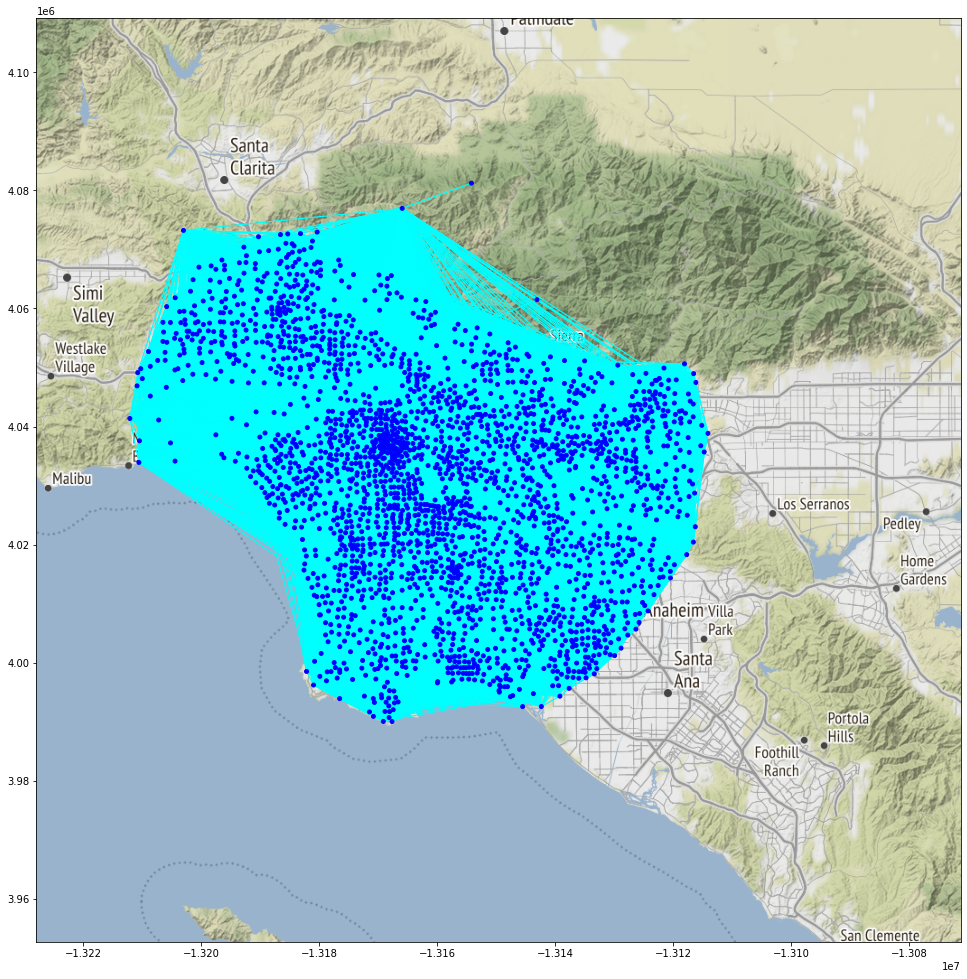

In [290]:
start = time.time()
plot_graph(uber, "results/q6.png")
end = time.time()
print(end - start)

As we can see, almost each location was either a destination or initial point at least once.

# Question 7

Build a minimum spanning tree (MST) of graph $G$. Report the street addresses near the two endpoints (the centroid locations) of a few edges. Are the results intuitive?

In [530]:
uber_mst = uber.spanning_tree(weights=uber.es['mean_travel_time'])

Plot MST

In [16]:
for i in range(uber_mst.vcount()):
    uber_mst.vs[i]["color"] = (0, 0, 1)
    uber_mst.vs[i]["size"] = 1 

for i in range(uber_mst.ecount()):
    uber_mst.es[i]["color"] = (1, 0, 0)
    uber_mst.es[i]["size"] = 50 


2.423133373260498


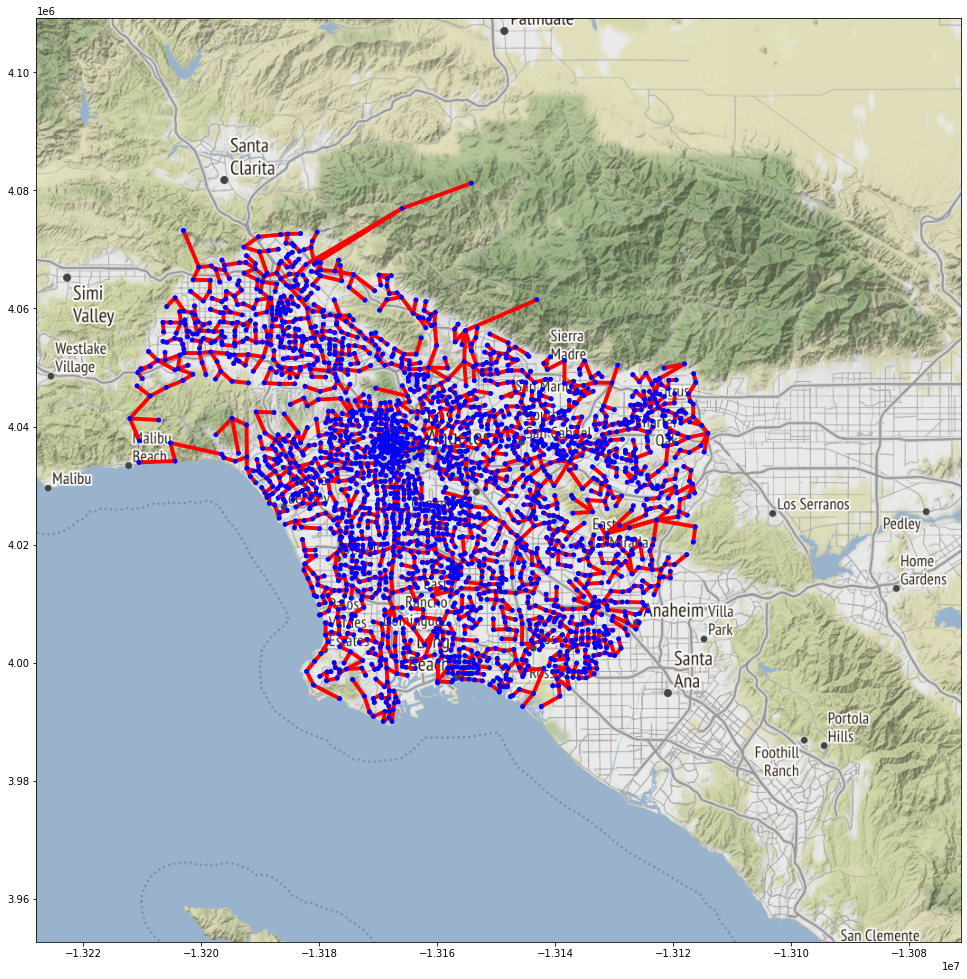

In [17]:
start = time.time()
plot_graph(uber_mst, "results/q7.png")
end = time.time()
print(end - start)

To find street addresses, chose some edge $i$, get vertices that are connected by this edge $a$ and $b$, retreive their coordinates, and past in google such that link looks like

https://www.google.com/maps/@x,y,Mz

where $x$ is a second coordinate of the centroid, $y$ is the first, $M$ is a multiplication factor for scale. Choose $M=20$ for convenience. Click $2$ times on the street closest to the center of the screen. This will be your street. 

In [532]:
def retreive_coord(idx, graph):
    # retreive an edge with this index
    e = graph.es[idx]
    # find igraph id-s (not uber id-s!) of incident vertices
    v1_id, v2_id = e.source, e.target 
    # retreive vertices
    v1, v2 = graph.vs[v1_id], graph.vs[v2_id]
    # print their centroid in REVERSED order (see explanation in text cell above)
    print("first point's uber id", v1["name"], "and coordinates", v1["centroid"][1], v1["centroid"][0])
    print("google link:")
    print("https://www.google.com/maps/@{x},{y},20z".format(x = v1["centroid"][1], y=v1["centroid"][0]))
    print("second point's uber id", v2["name"], "and coordinates", v2["centroid"][1], v2["centroid"][0])
    print("google link:")
    print("https://www.google.com/maps/@{x},{y},20z".format(x = v2["centroid"][1], y=v2["centroid"][0]))

In [535]:
# choose index to look into 
index = 0
# get links
retreive_coord(index, uber_mst)

first point's uber id 1.0 and coordinates 34.103095573770496 -118.12053321311474
google link:
https://www.google.com/maps/@34.103095573770496,-118.12053321311474,20z
second point's uber id 3.0 and coordinates 34.09626386363636 -118.13138209090911
google link:
https://www.google.com/maps/@34.09626386363636,-118.13138209090911,20z


In [536]:
# choose index to look into 
index = 25
# check coordinates
retreive_coord(index, uber_mst)

first point's uber id 21.0 and coordinates 34.06994802040815 -118.15898950000003
google link:
https://www.google.com/maps/@34.06994802040815,-118.15898950000003,20z
second point's uber id 22.0 and coordinates 34.064586108910895 -118.1490713069307
google link:
https://www.google.com/maps/@34.064586108910895,-118.1490713069307,20z


In [537]:
# choose index to look into 
index = 100
# check coordinates
retreive_coord(index, uber_mst)

first point's uber id 78.0 and coordinates 33.98065181395349 -118.19460306976742
google link:
https://www.google.com/maps/@33.98065181395349,-118.19460306976742,20z
second point's uber id 79.0 and coordinates 33.97718283333333 -118.19844175925924
google link:
https://www.google.com/maps/@33.97718283333333,-118.19844175925924,20z


# Question 8

Determine what percentage of triangles in the graph (sets of $3$ points on the map) satisfy the triangle inequality. You do not need to inspect all triangles, you can just estimate by random sampling of $1000$ triangles.


Let's find the percentage by using the definition of the triangle is "3 vertices directly connected by edges". If we use this definition, a triangle is basically a clique (fully connected susbset) of size of 3.

In [292]:
def check_type_1_inequality(graph, vertex_ids):
    # this function checks whether the triangle inequality works for specified triangle
    # vertex_id-s are assumed to be connected
    # collect id-s
    id1, id2, id3 = vertex_ids
    # get id-s of the edges connecting them
    edges = graph.get_eids(pairs=[(id1, id2), (id2, id3), (id3, id1)], directed=False)
    # get lengths
    side_a = graph.es[edges[0]]['mean_travel_time']
    side_b = graph.es[edges[1]]['mean_travel_time']
    side_c = graph.es[edges[2]]['mean_travel_time']
    # check if triangle inequality is satisfied for all sides
    satisfy = (side_a + side_b > side_c) and (side_b + side_c > side_a) and (side_c + side_a > side_b)
    return satisfy

In [345]:
# set up the number of triangles to test on
SAMPLE_SIZE = 1000

# select the size of the subgraph we will consider for efficiency
buffer_size = 40
# select offset, i.e. how strongly we shift the window of size "buffer_size" of vertices we will look into
offset = np.random.randint(0, high=uber.vcount() - buffer_size - 1)
# get a list of vertices to select for the subgraph
sub_vertices = list(offset + np.arange(buffer_size))
# derive the subgraph
triangles_uber = uber.subgraph(sub_vertices)
# find all triangles in the subgraph
traingles_type_1 = triangles_uber.cliques(min=3, max=3)
print("total number of triangles in the window:", len(traingles_type_1))
if len(traingles_type_1) < SAMPLE_SIZE:
    print("Not enough trianlges to work with! Select larger beuffer size")
else:
    # randomly sample enough triangles, remove all others
    traingles_type_1 = random.sample(traingles_type_1, SAMPLE_SIZE)
    print("Sampled", len(traingles_type_1), "for evaluation")
    # init counter to check how many traingles satisfy the equality
    good_triangles_counter = 0
    # sweer through seleted triangles and check if they are good
    for i in range(len(traingles_type_1)):
        if check_type_1_inequality(triangles_uber, traingles_type_1[i]):
            good_triangles_counter += 1
    # normilize and print the percentage of good triangles
    good_triangles_counter /= SAMPLE_SIZE
    print(good_triangles_counter)

total number of triangles in the window: 9880
Sampled 1000 for evaluation
0.923


Let's find the percentage by using the definition of the triangle is "any 3 vertices". If we use this definition, each edge is a shortest path from 1 vertex to another.

# Question 9

Now, we want to find an approximation solution for the traveling salesman problem (TSP) on $G$. Apply the 1-approximate algorithm described in the class. Inspect the sequence of street addresses visited on the map and see if the results are intuitive. Find an upper bound on the empirical performance of the approximate algorithm:

Obviously, the upper bound on approximate solution is 2 lengths of MST

The algorithm to find an approximate solution for travelling salesman problem:

1. Find minimum spanning tree
2. Create a directed graph from it
3. Find an Euler cycle in multi-graph
- Choose a vertex, and follow any of its output edges at random until you return back
- Sweep through all vertices of the obtained graph. If there exist a vertex $v$ that is connected to an output edge that does not belong to the obtained graph, repeat in cycle
- until a vertex described above exist, start another trial from this vertext that can use only the edges that have not been visited before. Join new path with already existing path.

In [250]:
def get_euleriean_cycle(start_id, graph):
    # initialize current vertex id
    v_current_id = start_id
    # initialize vertex and edge paths
    v_path = [v_current_id]
    e_path = []
    
    # get unvisited edges connected to it
    edges = graph.vs[v_current_id].out_edges()
    # find their id-s
    edge_ids = [edge.index for edge in edges if edge["visited"] is False]
    # choose a random edge
    next_edge_id = random.choice(edge_ids)
    # mark it as visited
    graph.es[next_edge_id]["visited"] = True
    # record it into memory
    e_path.append(next_edge_id)
    # get the next pont
    v_current_id = graph.es[next_edge_id].target
    # record it into memory
    v_path.append(v_current_id)
    
    # until the end point is not the same as the start point
    while v_current_id != start_id:
        # get unvisited edges connected to it
        edges = graph.vs[v_current_id].out_edges()
        # find their id-s
        edge_ids = [edge.index for edge in edges if edge["visited"] is False]
        # choose a random edge
        next_edge_id = random.choice(edge_ids)
        # mark it as visited
        graph.es[next_edge_id]["visited"] = True
        # record it into memory
        e_path.append(next_edge_id)
        # get the next pont
        v_current_id = graph.es[next_edge_id].target
        # record it into memory
        v_path.append(v_current_id)
        
    return v_path, e_path

In [274]:
# copy minimum spanning tree
uber_mst_directed = uber_mst.copy()
# convert graph to directed
uber_mst_directed.to_directed(mode=True)
# add a "visited" property to each edge of the graph. By default, it is false
for i in range(uber_mst_directed.ecount()):
    uber_mst_directed.es[i]["visited"] = False

    
# choose a random vertex to start from, for example, zero
v_start_id = 0

# get some path
v_path, e_path = get_euleriean_cycle(v_start_id, uber_mst_directed)

# now we check for edges that have not yet been visited that appear on our path
# initialize an index of the vertex we are currently surveying for unvisited edges
survey_id = 0

# until we have not sweeped through all vertices on our path
while survey_id < len(v_path) - 1:
    # get unvisited edges connected to it
    edges = uber_mst_directed.vs[v_path[survey_id]].out_edges()
    # find their id-s
    edge_ids = [edge.index for edge in edges if edge["visited"] is False]
    # if there is an edge that satisfies our criteria
    if len(edge_ids) > 0:
        # get one more eulerian cycle
        v_sub_path, e_sub_path = get_euleriean_cycle(v_path[survey_id], uber_mst_directed)
        # divide the list in 2 sublists
        before_v, after_v = v_path[0:survey_id], v_path[survey_id + 1:]
        before_e, after_e = e_path[0:survey_id], e_path[survey_id:]
        # concatenate them with new input part
        v_path = []
        v_path.extend(before_v)
        v_path.extend(v_sub_path)
        v_path.extend(after_v)
        e_path = []
        e_path.extend(before_e)
        e_path.extend(e_sub_path)
        e_path.extend(after_e)
    
    # move to the next veretex
    survey_id += 1

In [281]:
correct = True
for i in range(uber_mst_directed.ecount()):
    if uber_mst_directed.es[i].index not in e_path:
        print(uber_mst_directed.es[i].index)
        correct = False
        
print(correct)

True


In [541]:
offset = 20

for i in range(4):
    print(e_path[offset + i])
    retreive_coord(e_path[offset + i], uber_mst_directed)

3813
first point's uber id 1048.0 and coordinates 34.12479304651163 -118.16984624418603
google link:
https://www.google.com/maps/@34.12479304651163,-118.16984624418603,20z
second point's uber id 1046.0 and coordinates 34.12044833333333 -118.1829551884058
google link:
https://www.google.com/maps/@34.12044833333333,-118.1829551884058,20z
1166
first point's uber id 1046.0 and coordinates 34.12044833333333 -118.1829551884058
google link:
https://www.google.com/maps/@34.12044833333333,-118.1829551884058,20z
second point's uber id 1049.0 and coordinates 34.11932847499999 -118.18758254999997
google link:
https://www.google.com/maps/@34.11932847499999,-118.18758254999997,20z
1171
first point's uber id 1049.0 and coordinates 34.11932847499999 -118.18758254999997
google link:
https://www.google.com/maps/@34.11932847499999,-118.18758254999997,20z
second point's uber id 1058.0 and coordinates 34.11539226086957 -118.18893304347824
google link:
https://www.google.com/maps/@34.11539226086957,-118.188

# Question 10

Plot the trajectory that Santa has to travel!

In [602]:
total_time = 0

for i in range(len(e_path)):
    total_time += uber_mst_directed.es[e_path[i]]["mean_travel_time"]

print("Total time to cover the solution of TSP", total_time / 3600, "hrs")

Total time to cover the solution of TSP 149.491413888889 hrs


In [596]:
def plot_trajectory(g, trajectory, path, margin = 0.1):
    """
    a function that allows to plot specified graph over a map
    Args:
        g (igraph.Grah):        graph to plot. Each vertex needs to have attributes: 
                                    centroid    latitude and longditude of the point
                                    size        a multipler of the preset diameter; size = 1 corresponds to 
                                                1 / 10000 of the figure size
                                    color       color of the vertex
                                Each edge needs to have attributes:
                                    width       a multipler of the preset width; width = 1 corresponds to 
                                                1 / 2000000 of the figure size
                                    color       color of the edge
        trajectory (list):      list with edges that are included in the trajectory
        path (str):             path to save graph to
        margin (float):         how much of additional map space is added to the bounding box of vertex 
                                coordinates                  
    """    
    # init output figure
    fig, ax = plt.subplots(figsize=(17, 17))
    
    # init coordinates of the snapshot
    west, south, east, north = centroids[1][0], centroids[1][1], centroids[1][0], centroids[1][1]
    # sweep through all centroids to crorect coordinates of the bounding box
    for key in centroids.keys():
        if centroids[key][0] < west:
            west = centroids[key][0]
        if centroids[key][0] > east:
            east = centroids[key][0]
        if centroids[key][1] > north:
            north = centroids[key][1]
        if centroids[key][1] < south:
            south = centroids[key][1]
    # get the center of snapshot
    x_center_degrees = (west - east) / 2 + east
    y_center_degrees = (north - south) / 2 + south
    # choose the higher dimensions, and make the dimension of the other coordinate match with it, with 5% addition
    # to both dimesions
    margin = 0.1
    # choose an arbitrary dimension
    dim = abs(west - east)
    # check if it is the largest, and if it is not, reset it
    if abs(north - south) > dim: dim = abs(north - south)
    # reset the coordinates
    west = x_center_degrees - dim * (1 + margin) / 2
    east = x_center_degrees + dim * (1 + margin) / 2
    north = y_center_degrees + dim * (1 + margin) / 2
    south = y_center_degrees - dim * (1 + margin) / 2
    
    # download a snapshot of the map
    ghent_img, ghent_ext = cx.bounds2img(west,
                                     south,
                                     east,
                                     north,
                                     ll=True,
                                     source=cx.providers.Stamen.Terrain)
    # add it to the figure
    ax.imshow(ghent_img, extent=ghent_ext)
    
    # at this point a picture is guaranteed to have "approximately" square form; if precision is not sufficient
    # this can be relaced by separate x and y scales
    scale_contextily = abs(ghent_ext[0] - ghent_ext[1])
    # calculate unit diameter of points and width of lines
    unit_vertex = scale_contextily / 10000
    unit_edge = scale_contextily / 2000000
    # initialize transformer to convert coordinates to web merkator
    transformer = Transformer.from_crs("epsg:4326", "epsg:3857")
    
    # init arrays for vertices' coordinates, colors and sizes
    vertex_xs = np.zeros((g.vcount()))
    vertex_ys = np.zeros((g.vcount()))
    vertex_colors = np.zeros((g.vcount(), 3))
    vertex_sizes = np.zeros((g.vcount()))
    # init array for edges coordinates: (num_lines, num_point_in_line, dots_dim), colors and sizes
    edges_coords = np.zeros((g.ecount(), 2, 2))
    edges_colors = np.zeros((g.ecount(), 3))
    edges_sizes = np.zeros((g.ecount()))
    # for each vertex
    for i in range(g.vcount()):
        # convert coordinates to web merkator
        g.vs[i]['x'], g.vs[i]['y'] = transformer.transform(g.vs[i]["centroid"][1], g.vs[i]["centroid"][0])
        # store coordinates in the array for plotting
        vertex_xs[i] = g.vs[i]['x']
        vertex_ys[i] = g.vs[i]['y']
        # store rgb colors for plotting, if color is present in attributes
        if "color" in g.vs[i].attributes().keys():
            vertex_colors[i] = g.vs[i]["color"]
        else:
            # else set default blue
            vertex_colors[i] = (0, 0, 1)
        # store relative sizes for plotting, if size is present in attributes
        if "size" in g.vs[i].attributes().keys():
            vertex_sizes[i] = g.vs[i]["size"]
        else:
            # else set default 1
            vertex_sizes[i] = 0.1
    
    style = "Simple, tail_width=0.75, head_width=5, head_length=10"
    
    minima = 0
    maxima = len(trajectory)

    norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap="cool")
    
    # for edge in the trajectory
    for i in range(len(trajectory)):
        # get the edge
        ed = g.es[trajectory[i]]
        # get the id-s of a start and end points
        v_source_id, v_target_id = ed.source, ed.target
        # fill the coordinates for the source
        edges_coords[i, 0, 0], edges_coords[i, 0, 1] = g.vs[v_source_id]["x"], g.vs[v_source_id]["y"]
        # fill the coordinates for the target
        edges_coords[i, 1, 0], edges_coords[i, 1, 1] = g.vs[v_target_id]["x"], g.vs[v_target_id]["y"]
        # store rgb colors for plotting, if color is present in attributes
        if "color" in g.es[i].attributes().keys():
            edges_colors[i] = g.es[i]["color"]
        else:
            # else set default cyan
            edges_colors[i] = (0, 1, 1)
        # store relative sizes for plotting, if size is present in attributes
        if "size" in g.es[i].attributes().keys():
            edges_sizes[i] = g.es[i]["size"]
        else:
            # else set default 1
            edges_sizes[i] = 1
        
        # get a color
        col = mapper.to_rgba(i)
        
        kw = dict(arrowstyle=style, color=col)
        # create a new path
        arrow = patches.FancyArrowPatch((edges_coords[i, 0, 0], edges_coords[i, 0, 1]), 
                                        (edges_coords[i, 1, 0], edges_coords[i, 1, 1]), 
                                        connectionstyle="arc3,rad=.35", **kw)
        ax.add_patch(arrow)
    
    # create a scatter plot for vertices
    ax.scatter(vertex_xs, 
               vertex_ys,
               s=vertex_sizes * unit_vertex,
               c=vertex_colors, 
               marker='o',
               zorder=2)
    # save the figure
    plt.savefig(path, dpi=300)

24.385759592056274


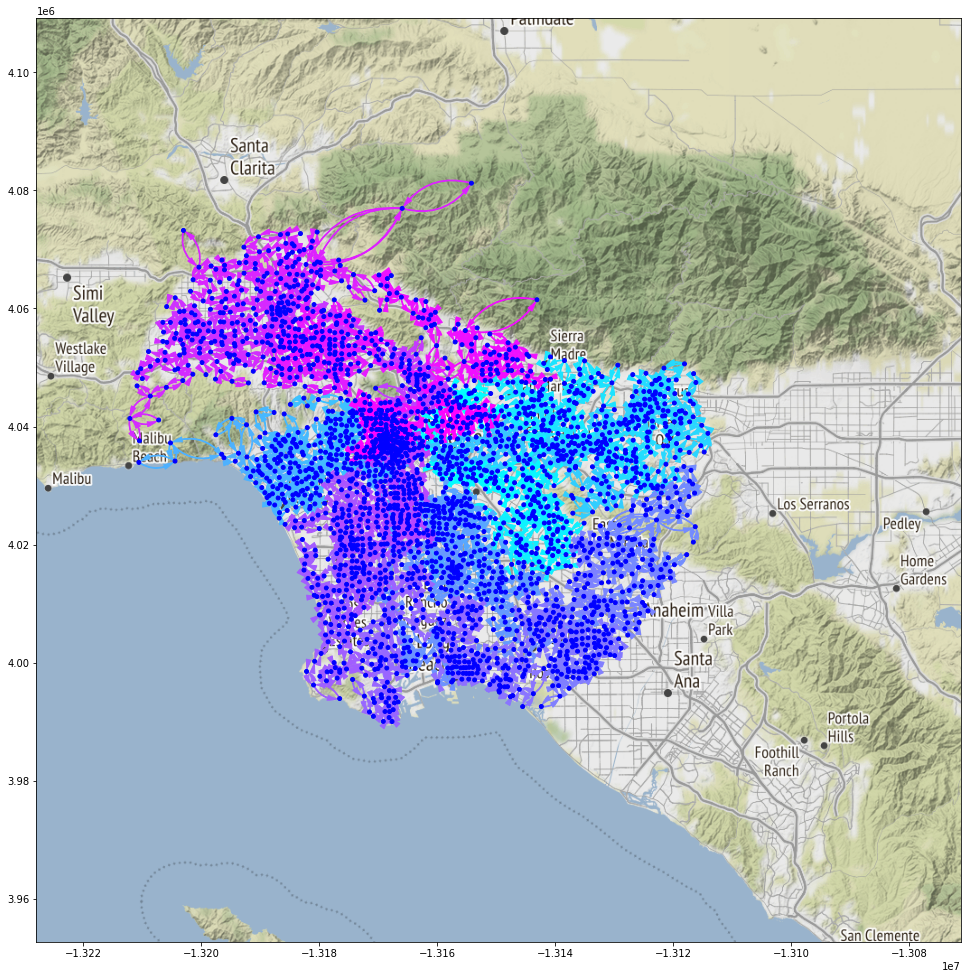

In [598]:
start = time.time()
plot_trajectory(uber_mst_directed, e_path, "results/q10.png")
end = time.time()
print(end - start)

# Question 11

Plot the road mesh that you obtain and explain the result. Create a graph $G_\Delta$ whose nodes are different locations and its edges are produced by triangulation.

In [18]:
# initialize a matrix to store coordinates
coord_triang = np.zeros((uber.vcount(), 2))
# fill the coordinates from each vertex
for i in range(uber.vcount()):
    # remember that x is the second variable
    coord_triang[i, 0], coord_triang[i, 1] = uber.vs[i]["centroid"][1], uber.vs[i]["centroid"][0]
# find triangluation
triang = Delaunay(coord_triang)

In [19]:
# triang.simplices store the id-s of vertices that form triangles
print(triang.simplices)

[[2421 2419 2418]
 [ 983 2415 2419]
 [1699 1783 1860]
 ...
 [ 199 2357  196]
 [ 196 2357 1696]
 [2357  198 1696]]


In [20]:
# create a new graph as a copy of the original
uber_triangle = uber.copy()
# delete all edges of said traingle
uber_triangle.delete_edges(np.arange(uber_triangle.ecount()))
# verify that no edge from the original graph remained
print("deleted all edges from the graph. Number of edges remained is", uber_triangle.ecount())
# init a numpy list with edges we need to add to the graph
triangle_edges = np.zeros((len(triang.simplices) * 3, 2))
# for each traingele in a mesh
for i in range(len(triang.simplices)):
    # record to add 3 new edges to the graph
    triangle_edges[i * 3]     = triang.simplices[i, 0], triang.simplices[i, 1]
    triangle_edges[i * 3 + 1] = triang.simplices[i, 1], triang.simplices[i, 2]
    triangle_edges[i * 3 + 2] = triang.simplices[i, 2], triang.simplices[i, 0]
# convert to appropriate type
triangle_edges = triangle_edges.astype(int)
# add said edges to the graph
uber_triangle.add_edges(triangle_edges)
# delete repeating edges
uber_triangle.simplify()
print("Now the graph has", uber_triangle.ecount(), "edges")

deleted all edges from the graph. Number of edges remained is 0
Now the graph has 7923 edges


In [21]:
# increase size of the edges in the graph
for i in range(uber_triangle.ecount()):
    uber_triangle.es[i]["color"] = (1, 0, 1)
    uber_triangle.es[i]["size"] = 15

3.071528196334839


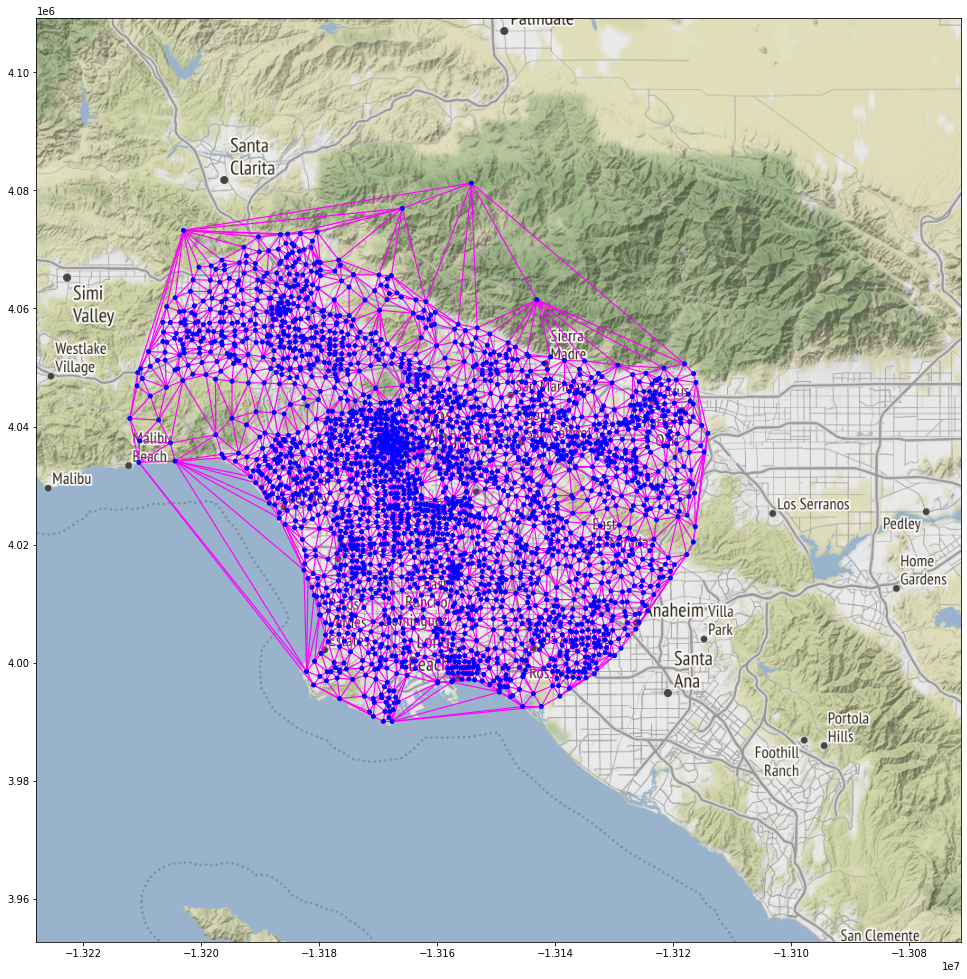

In [546]:
start = time.time()
plot_graph(uber_triangle, "results/temp.png")
end = time.time()
print(end - start)

# Question 12

Using simple math, calculate the traffic flow for each road in terms of cars/hour. Report your derivation.

To find flow between 2 connected points in the graph:

1. Calculate distance as a square root of sum of squares of delta coordinates.
2. Multiply that by 69 miles.
3. Divide by the average time of commuting - get an average speed.
4. Multiply that by 2 seconds to get the safety distance, than add it to the car length, to get the overall space that a single car takes.
5. Now multiply speed by an hour and 2, and divide by the total space, to get the total number of cars that can go per hour through the edge.
6. Create a new graph where each undirected edge is doubled, and directed edges have capacity as above.

TA advice: for edges that exist you transfer speed from graph $G$. For edges that do not exist you compute speed as shortest path. 

In [23]:
# first, add commute time for each of the edges
for i in range(uber_triangle.ecount()):
    # get the source and the destination id of the vertices connected by this edge
    v_source_id, v_target_id = uber_triangle.es[i].source, uber_triangle.es[i].target    
    # get their names as strings
    v_source_name = uber_triangle.vs[v_source_id]["vetrex_name_string"]
    v_target_name = uber_triangle.vs[v_target_id]["vetrex_name_string"]
    # find them in the original graph
    v_source_id_uber = uber.vs.find(vetrex_name_string=v_source_name)
    v_target_id_uber = uber.vs.find(vetrex_name_string=v_target_name)
    # check if they are connected
    edge_id_uber = uber.get_eid(v_source_id_uber, v_target_id_uber, directed=False, error=False)
    if edge_id_uber == -1:
        # if they are not, find the shortest path
        uber_triangle.es[i]["mean_travel_time"] = uber.shortest_paths_dijkstra(source=v_source_id_uber,
                                                                      target=v_target_id_uber,
                                                                      weights="mean_travel_time",
                                                                      mode='all')[0][0]
    else:
        # if they are, assing a mean travel time
        uber_triangle.es[i]["mean_travel_time"] = uber.es[edge_id_uber]["mean_travel_time"]

In [24]:
# second, compute flow for each of the edges in ONE direction
for i in range(uber_triangle.ecount()):
    # get the source and the destination id of the vertices connected by this edge
    v_source_id, v_target_id = uber_triangle.es[i].source, uber_triangle.es[i].target
    # get the coordinates of source and destination in degrees
    x_source_deg, y_source_deg = uber_triangle.vs[v_source_id]["centroid"]
    x_target_deg, y_target_deg = uber_triangle.vs[v_target_id]["centroid"]
    # compute the distance in degrees between those 2 points
    dist_degrees = ((x_target_deg - x_source_deg) ** 2 + (y_target_deg - y_source_deg) ** 2) ** (1/2)
    # rescale it into miles
    dist_miles = dist_degrees * 69
    # get average speed per second
    avg_speed = dist_miles / (uber_triangle.es[i]["mean_travel_time"])
    # get the total space a car takes by adding a safety distance with car length
    total_space = avg_speed * 2 + 0.003 
    # get the total number of cars that can flow in one direction per hour
    total_cars = avg_speed * 3600 * 2 / total_space
    # save it as a parameter
    uber_triangle.es[i]["max_flow"] = total_cars

In [25]:
# thrid, create a copy of the current graph
uber_triangle_directed = uber_triangle.copy()
# convert graph to directed
uber_triangle_directed.to_directed(mode=True)

In [26]:
# check that back-and-forth edges have the same properties
uber_triangle_directed.is_directed()
edge1 = uber_triangle_directed.get_eid(0, 2, directed=True, error=False)
edge2 = uber_triangle_directed.get_eid(2, 0, directed=True, error=False)
print(edge1)
print(edge2)
print(uber_triangle_directed.es[edge1])
print(uber_triangle_directed.es[edge2])

0
7923
igraph.Edge(<igraph.Graph object at 0x7fcdf98f7220>, 0, {'color': (1, 0, 1), 'size': 15, 'mean_travel_time': 129.76500000000001, 'max_flow': 2950.7397388860118})
igraph.Edge(<igraph.Graph object at 0x7fcdf98f7220>, 7923, {'color': (1, 0, 1), 'size': 15, 'mean_travel_time': 129.76500000000001, 'max_flow': 2950.7397388860118})


# Question 13 

Calculate the maximum number of cars that can commute per hour from Malibu to Long Beach. Also calculate the number of edge-disjoint paths between the two spots. Does the number of edge-disjoint paths match what you see on your road map?

In [27]:
def find_closest_vertex(cooridnate, ctrds):
    # returns the id of the region which centroid is closest to the specified coordinate
    # choose some initial id at random
    opt_id = list(ctrds.keys())[0]
    # calculate the distance between the target and random id
    opt_distance = ((cooridnate[0] - ctrds[opt_id][1]) ** 2 + (cooridnate[1] - ctrds[opt_id][0]) ** 2) ** (1 / 2) 
    # sweep through all locations
    for key in ctrds.keys():
        # if new id is closer to the target
        if ((cooridnate[0] - ctrds[key][1]) ** 2 + (cooridnate[1] - ctrds[key][0]) ** 2) ** (1 / 2) < opt_distance:
            # than select it as optimal
            opt_id = key
            opt_distance = ((cooridnate[0] - ctrds[key][1]) ** 2 + (cooridnate[1] - ctrds[key][0]) ** 2) ** (1 / 2)
    return opt_id

In [28]:
# find the id of a vertex with a coordinate closest to malibu
malibu_deg = [34.04, -118.56]
malibu_id = find_closest_vertex(malibu_deg, centroids)
print(malibu_id)
# find the string identificator of the vertex closest to malibu
malibu_vertex_string = str(malibu_id) + ".0a"
# find the vertex id
malibu_vertex = uber_triangle_directed.vs.find(vetrex_name_string=malibu_vertex_string)
print(malibu_vertex)
malibu_vertex_id = malibu_vertex.index
print(malibu_vertex_id)
# find the id of a vertex with a coordinate closest to Long Beach
long_beach_deg = [33.77, -118.18]
long_beach_id = find_closest_vertex(long_beach_deg, centroids)
print(long_beach_id)
# find the string identificator of the vertex closest to Long Beach
long_beach_vertex_string = str(long_beach_id) + ".0a"
# find the vertex id
long_beach_vertex = uber_triangle_directed.vs.find(vetrex_name_string=long_beach_vertex_string)
print(long_beach_vertex)
long_beach_vertex_id = long_beach_vertex.index
print(long_beach_vertex_id)

1523
igraph.Vertex(<igraph.Graph object at 0x7fcdf98f7220>, 1511, {'name': 1523.0, 'centroid': [-118.54625915050165, 34.048403046822735], 'vetrex_name_string': '1523.0a', 'x': -13196509.204081291, 'y': 4035303.2259358317})
1511
672
igraph.Vertex(<igraph.Graph object at 0x7fcdf98f7220>, 660, {'name': 672.0, 'centroid': [-118.17865950000001, 33.771767700000005], 'vetrex_name_string': '672.0a', 'x': -13155588.198171662, 'y': 3998197.020574805})
660


In [62]:
# find the vertex with a coordinate closest to malibu
M_to_LB_flow = uber_triangle_directed.maxflow(malibu_vertex_id, 
                                              long_beach_vertex_id,
                                              capacity='max_flow')
print(M_to_LB_flow)

Graph flow (4 edges, 1 vs 2648 vertices, value=11074.1447)


In [73]:
# let's copy the original triangle graph
uber_triangle_plotting_copy = uber_triangle.copy() 

# let's reset default vertex parameters for the triangle graph
for i in range(uber_triangle_plotting_copy.vcount()):
    uber_triangle_plotting_copy.vs[i]["color"] = (0, 0, 1)
    uber_triangle_plotting_copy.vs[i]["size"] = 0.1

# we need to specify source and destination points with big red dots
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["size"] = 2
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["size"] = 2

# increase size of the edges in the graph
for i in range(uber_triangle.ecount()):
    uber_triangle_plotting_copy.es[i]["color"] = (1, 0, 1)
    uber_triangle_plotting_copy.es[i]["size"] = 5

In [75]:
# for each edge 
for i in range(uber_triangle_directed.ecount()):
    # which has a positive flow
    if M_to_LB_flow.flow[i] > 1:
        # find the id-s of the vertices it connects
        source_id, target_id = uber_triangle_directed.es[i].source, uber_triangle_directed.es[i].target
        # find their string names
        source_name = uber_triangle_directed.vs[source_id]["vetrex_name_string"]
        target_name = uber_triangle_directed.vs[target_id]["vetrex_name_string"]
        # find their id-s in plotting copy
        source_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=source_name).index
        target_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=target_name).index
        # find the edge they are connected by
        edge_id = uber_triangle_plotting_copy.get_eid(source_id, target_id, directed=False, error=False)
        # find the eastpoint
        # eastpoint = find_closest_vertex([34.101, -118.693], centroids)
        # if coordinate is valid
        if uber_triangle_plotting_copy.vs[source_id]["centroid"][1] < 34.101 and \
            uber_triangle_plotting_copy.vs[target_id]["centroid"][1] < 34.101:
            # if the id is valid
            if edge_id > 0:
                # color it and increase size
                uber_triangle_plotting_copy.es[edge_id]["color"] = (1, 1, 0)
                uber_triangle_plotting_copy.es[edge_id]["size"] = 30
            # else pop up an error
            else:
                print("no edge is found!")

2.6441140174865723


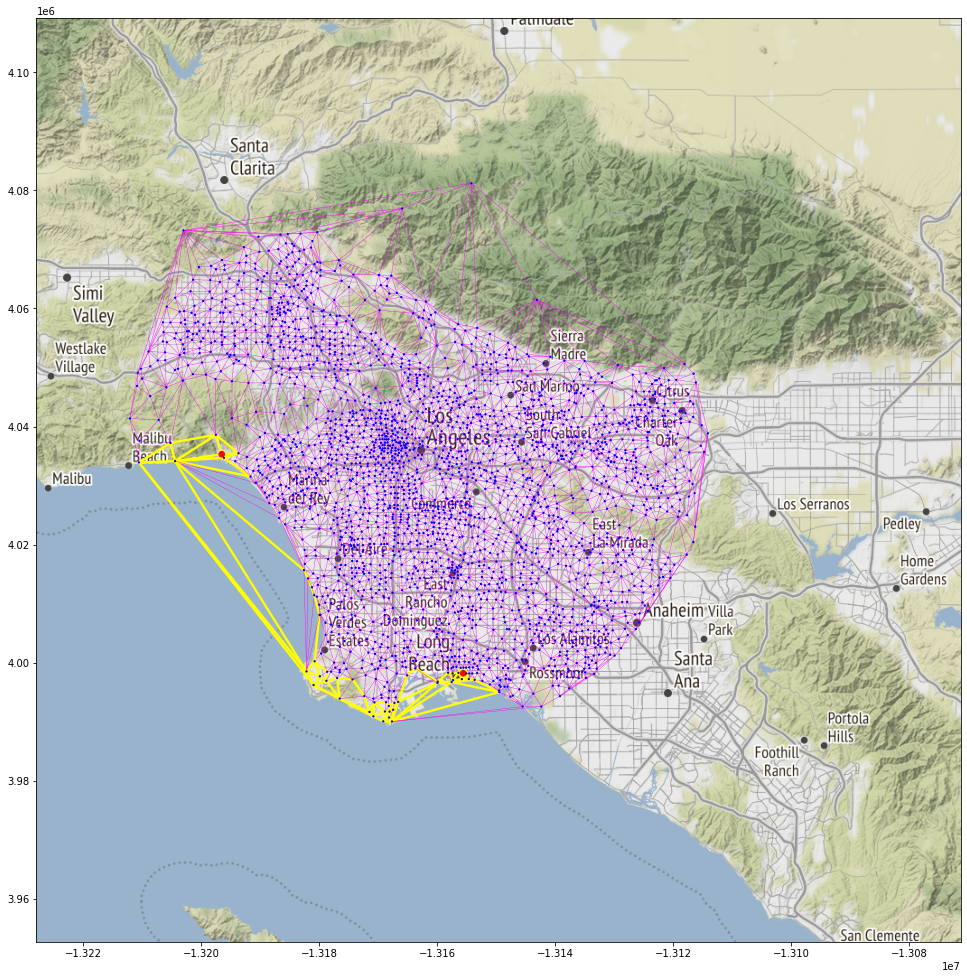

In [78]:
start = time.time()
plot_graph(uber_triangle_plotting_copy, "results/q13-maxflow.png")
end = time.time()
print(end - start)

Obviously, those are not the correct paths. The reason is that from the plot of traingulation we can see that Malibu Beach and Long Beach are connected with roads that go through the ocean. These roads do not exist in real life, and flow caclualated through them is some composition of flows thriugh other vertices.

On the other hand, we can check the number of all edge-disjoint paths

In [79]:
M_to_LB_paths = uber_triangle_directed.edge_disjoint_paths(source = malibu_vertex_id,
                                                           target = long_beach_vertex_id)

In [81]:
print(M_to_LB_paths)

4


The number of path is 4, because the out degree of the source vertex is only 4:

In [32]:
print(malibu_vertex.indegree())

4


Let's first collect the names of the edges in string disjoint paths. We will do that by creating a copy of the graph, and then iteratively finding a shortest then delete all edges from that path, until it becomes disconnected

In [100]:
# let's init paths list
paths = []
# get a copy of traingle graph
uber_triangle_directed_copy = uber_triangle_directed.copy()
# for each path in edge disjoint paths:
for i in range(M_to_LB_paths):
    # append a vertex path to the list
    paths.append(uber_triangle_directed_copy.get_shortest_paths(malibu_vertex_id, 
                                                                to=long_beach_vertex_id,
                                                                mode='out', 
                                                                output='vpath')[0])
    # get an edge path
    edges = uber_triangle_directed_copy.get_shortest_paths(malibu_vertex_id, 
                                                           to=long_beach_vertex_id,
                                                           mode='out', 
                                                           output='epath')[0]
    # delete those edges
    uber_triangle_directed_copy.delete_edges(np.array(edges))
    
print(paths)

[[1511, 1700, 1699, 1860, 1658, 1660, 1661, 2373, 663, 660], [1511, 1510, 1700, 1783, 1860, 1861, 1658, 1657, 1662, 1661, 2375, 665, 664, 661, 660], [1511, 1512, 1700, 1701, 1783, 1859, 1882, 1861, 1863, 1862, 1643, 1642, 1641, 2423, 2373, 653, 654, 660], [1511, 1509, 1510, 2417, 1699, 1783, 1782, 1781, 1858, 1879, 2043, 2042, 568, 570, 1643, 1644, 1641, 1638, 684, 651, 652, 654, 656, 660]]


In [101]:
# let's copy the original triangle graph
uber_triangle_plotting_copy = uber_triangle.copy() 

# let's reset default vertex parameters for the triangle graph
for i in range(uber_triangle_plotting_copy.vcount()):
    uber_triangle_plotting_copy.vs[i]["color"] = (0, 0, 1)
    uber_triangle_plotting_copy.vs[i]["size"] = 0.1

# we need to specify source and destination points with big red dots
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["size"] = 2
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["size"] = 2

# increase size of the edges in the graph
for i in range(uber_triangle.ecount()):
    uber_triangle_plotting_copy.es[i]["color"] = (1, 0, 1)
    uber_triangle_plotting_copy.es[i]["size"] = 5

In [102]:
# for each path from the paths
for i in range(len(paths)):
    for j in range(len(paths[i]) - 1):
        # find the string names of the vertices
        source_name = uber_triangle_directed_copy.vs[paths[i][j]]["vetrex_name_string"]
        target_name = uber_triangle_directed_copy.vs[paths[i][j+1]]["vetrex_name_string"]
        # find their id-s in plotting copy
        source_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=source_name).index
        target_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=target_name).index
        # find the edge they are connected by
        edge_id = uber_triangle_plotting_copy.get_eid(source_id, target_id, directed=False, error=False)
        # if the id is valid
        if edge_id > 0:
            # color it and increase size
            uber_triangle_plotting_copy.es[edge_id]["color"] = (1, 1, 0)
            uber_triangle_plotting_copy.es[edge_id]["size"] = 30
        # else pop up an error
        else:
            print("no edge is found!")

2.6548235416412354


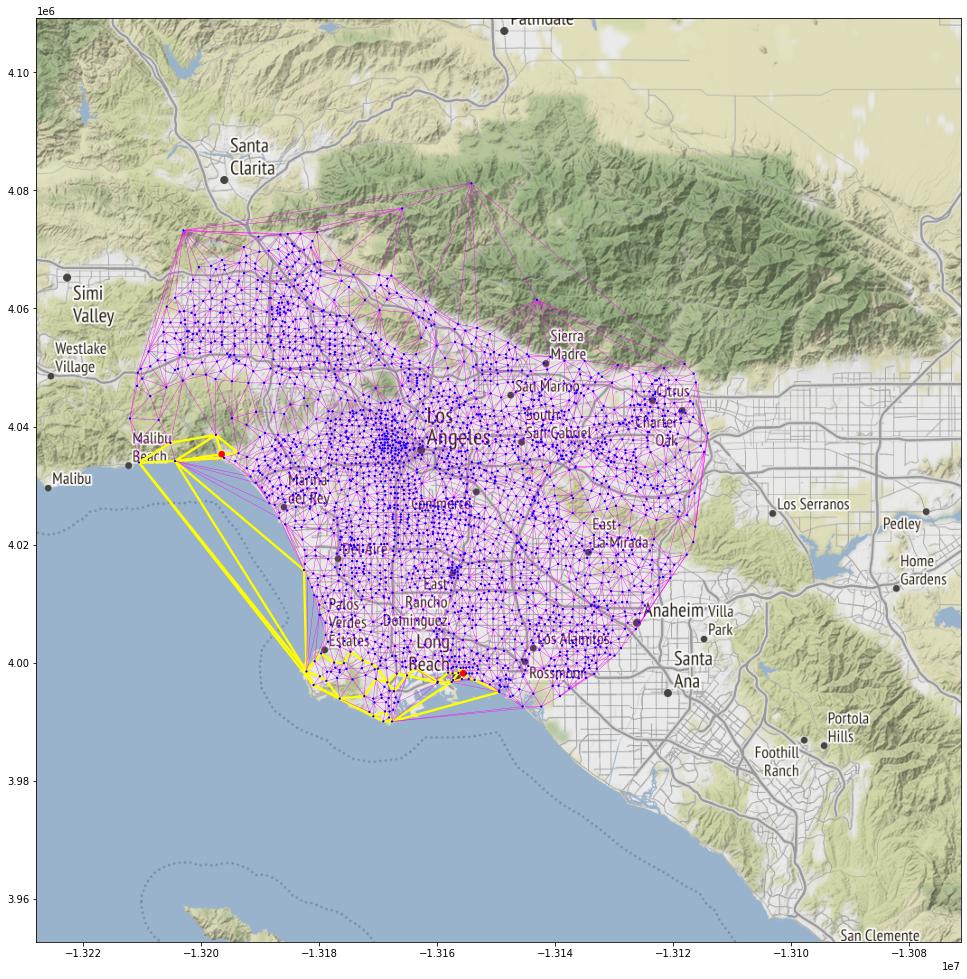

In [103]:
start = time.time()
plot_graph(uber_triangle_plotting_copy, "results/q13-edge-disjoint.png")
end = time.time()
print(end - start)

# Question 14

Plot $\tilde{G_{\Delta}}$ on actual coordinates. Do you think the thresholding method worked?

In [146]:
uber_triangle_directed_prune = uber_triangle_directed.copy()
thresh = 600
edges_to_delete = []
for i in range(len(uber_triangle_directed_prune.es)):
    travel_time = uber_triangle_directed_prune.es[i]['mean_travel_time']
    if travel_time > thresh:
        edges_to_delete.append(i)
        
uber_triangle_directed_prune.delete_edges(edges_to_delete)

2.7871062755584717


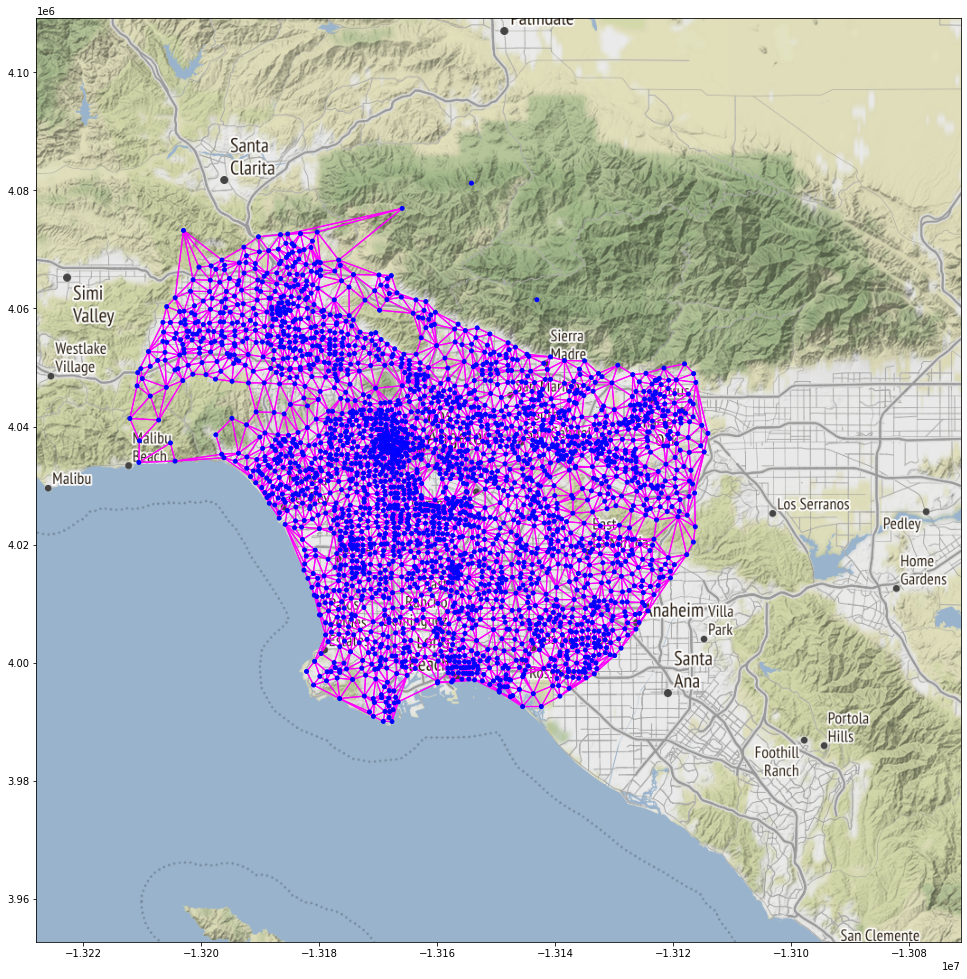

In [111]:
start = time.time()
plot_graph(uber_triangle_directed_prune, "results/q14.png")
end = time.time()
print(end - start)

Thresholding worked

# Question 15

Now, repeat question 13 for $\tilde{G_{\Delta}}$ and report the results. Do you see any changes? Why?

In [346]:
# find the id of a vertex with a coordinate closest to malibu
malibu_deg = [34.04, -118.56]
malibu_id = find_closest_vertex(malibu_deg, centroids)
print(malibu_id)
# find the string identificator of the vertex closest to malibu
malibu_vertex_string = str(malibu_id) + ".0a"
# find the vertex id
malibu_vertex = uber_triangle_directed_prune.vs.find(vetrex_name_string=malibu_vertex_string)
print(malibu_vertex)
malibu_vertex_id = malibu_vertex.index
print(malibu_vertex_id)
# find the id of a vertex with a coordinate closest to Long Beach
long_beach_deg = [33.77, -118.18]
long_beach_id = find_closest_vertex(long_beach_deg, centroids)
print(long_beach_id)
# find the string identificator of the vertex closest to Long Beach
long_beach_vertex_string = str(long_beach_id) + ".0a"
# find the vertex id
long_beach_vertex = uber_triangle_directed_prune.vs.find(vetrex_name_string=long_beach_vertex_string)
print(long_beach_vertex)
long_beach_vertex_id = long_beach_vertex.index
print(long_beach_vertex_id)

1523
igraph.Vertex(<igraph.Graph object at 0x7fcdf98f78b0>, 1511, {'name': 1523.0, 'centroid': [-118.54625915050165, 34.048403046822735], 'vetrex_name_string': '1523.0a', 'x': -13196509.204081291, 'y': 4035303.2259358317})
1511
672
igraph.Vertex(<igraph.Graph object at 0x7fcdf98f78b0>, 660, {'name': 672.0, 'centroid': [-118.17865950000001, 33.771767700000005], 'vetrex_name_string': '672.0a', 'x': -13155588.198171662, 'y': 3998197.020574805})
660


In [399]:
uber_triangle_directed_prune.vs.find(vetrex_name_string=str(find_closest_vertex([34.1642, -118.632], centroids)) + ".0a") 

igraph.Vertex(<igraph.Graph object at 0x7fcdf98f78b0>, 1672, {'name': 1684.0, 'centroid': [-118.63226818965522, 34.16680712068966], 'vetrex_name_string': '1684.0a', 'x': -13206083.686523484, 'y': 4051222.1993419454})

In [462]:
for edge in uber_triangle_directed_prune.vs[144].out_edges():
    print(edge.target)

145
147
985
1670
1672
2411
2412


In [ ]:
1670

In [412]:
uber_triangle_directed_prune.vs.find(vetrex_name_string=str(find_closest_vertex([34.1391, -118.6247], centroids)) + ".0a") 

igraph.Vertex(<igraph.Graph object at 0x7fcdf98f78b0>, 144, {'name': 146.0, 'centroid': [-118.63048660074622, 34.1327155932836], 'vetrex_name_string': '146.0a', 'x': -13205885.360953335, 'y': 4046636.439433296})

In [498]:
exclude = [1672, 145,
147,
985,
2411,
144]

In [441]:
# find the vertex with a coordinate closest to malibu
M_to_LB_flow = uber_triangle_directed_prune.maxflow(malibu_vertex_id, 
                                                    long_beach_vertex_id,
                                                    capacity='max_flow')
print(M_to_LB_flow)

Graph flow (4 edges, 3 vs 2646 vertices, value=11074.1447)


We can see that the value of max flow is the same, from which we can conclude that these were roads leading to Malibu Beach that were the bottleneck, not the other parts of the graph

In [499]:
# let's copy the original triangle graph
uber_triangle_plotting_copy = uber_triangle.copy() 

thresh = 600
edges_to_delete = []
for i in range(len(uber_triangle_plotting_copy.es)):
    travel_time = uber_triangle_plotting_copy.es[i]['mean_travel_time']
    if travel_time > thresh:
        edges_to_delete.append(i)
        
uber_triangle_plotting_copy.delete_edges(edges_to_delete)

# let's reset default vertex parameters for the triangle graph
for i in range(uber_triangle_plotting_copy.vcount()):
    uber_triangle_plotting_copy.vs[i]["color"] = (0, 0, 1)
    uber_triangle_plotting_copy.vs[i]["size"] = 0.1

# we need to specify source and destination points with big red dots
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["size"] = 2
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["size"] = 2

# increase size of the edges in the graph
for i in range(uber_triangle_plotting_copy.ecount()):
    uber_triangle_plotting_copy.es[i]["color"] = (1, 0, 1)
    uber_triangle_plotting_copy.es[i]["size"] = 5

In [495]:
for i in exclude:
    uber_triangle_plotting_copy.vs[i]["color"] = (1, 1, 0)
    uber_triangle_plotting_copy.vs[i]["size"] = 2

In [500]:
# for each edge 
for i in range(uber_triangle_directed_prune.ecount()):
    # which has a positive flow
    if M_to_LB_flow.flow[i] > 0:
        # find the id-s of the vertices it connects
        source_id, target_id = uber_triangle_directed_prune.es[i].source, uber_triangle_directed_prune.es[i].target
        # find their string names
        source_name = uber_triangle_directed_prune.vs[source_id]["vetrex_name_string"]
        target_name = uber_triangle_directed_prune.vs[target_id]["vetrex_name_string"]
        # find their id-s in plotting copy
        source_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=source_name).index
        target_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=target_name).index
        # find the edge they are connected by
        edge_id = uber_triangle_plotting_copy.get_eid(source_id, target_id, directed=False, error=False)
        # if coordinate is valid
        if source_id not in exclude and target_id not in exclude:
            # if the id is valid
            if edge_id > 0:
                # color it and increase size
                uber_triangle_plotting_copy.es[edge_id]["color"] = (1, 1, 0)
                uber_triangle_plotting_copy.es[edge_id]["size"] = 30
            # else pop up an error
            else:
                print("no edge is found!")

2.5086188316345215


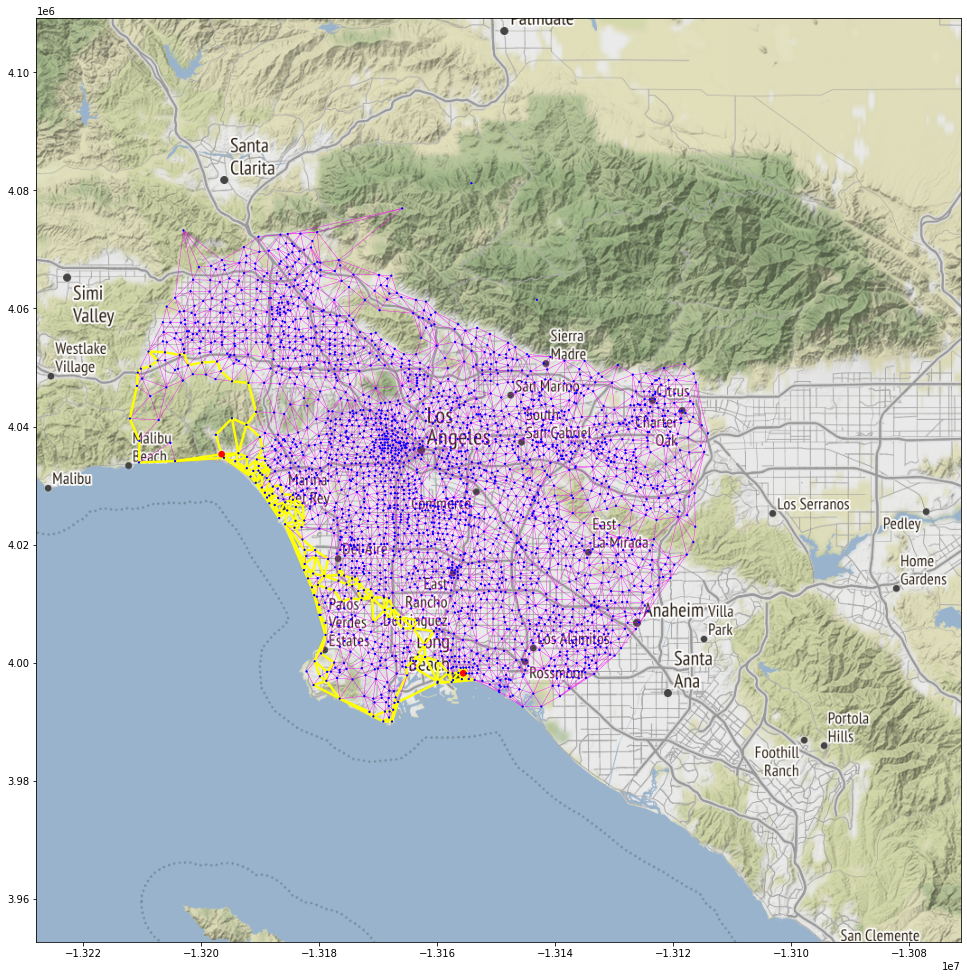

In [501]:
start = time.time()
plot_graph(uber_triangle_plotting_copy, "results/q15-maxflow.png")
end = time.time()
print(end - start)

In [140]:
M_to_LB_paths = uber_triangle_directed_prune.edge_disjoint_paths(source = malibu_vertex_id,
                                                           target = long_beach_vertex_id)

In [141]:
print(M_to_LB_paths)

4


In [139]:
# let's init paths list
paths = []
# get a copy of traingle graph
uber_triangle_directed_copy = uber_triangle_directed_prune.copy()
# for each path in edge disjoint paths:
for i in range(M_to_LB_paths):
    # append a vertex path to the list
    paths.append(uber_triangle_directed_copy.get_shortest_paths(malibu_vertex_id, 
                                                                to=long_beach_vertex_id,
                                                                mode='out', 
                                                                output='vpath')[0])
    # get an edge path
    edges = uber_triangle_directed_copy.get_shortest_paths(malibu_vertex_id, 
                                                           to=long_beach_vertex_id,
                                                           mode='out', 
                                                           output='epath')[0]
    # delete those edges
    uber_triangle_directed_copy.delete_edges(np.array(edges))
    
print(paths)

[[1511, 1512, 1941, 1950, 1584, 1590, 2406, 1612, 1701, 1704, 426, 2402, 1875, 1782, 1783, 1860, 1861, 1658, 1660, 1661, 1686, 2423, 2373, 663, 660], [1511, 1509, 1513, 1940, 1939, 1950, 1583, 1584, 1588, 1589, 2406, 1604, 1612, 324, 320, 1705, 424, 561, 560, 2399, 2016, 2017, 2134, 2365, 163, 165, 170, 610, 647, 651, 652, 654, 660], [1511, 1510, 1678, 1508, 1505, 1014, 1015, 1502, 112, 1545, 1546, 1569, 1571, 249, 1592, 1599, 1607, 1611, 1610, 323, 1705, 1706, 1866, 1868, 2020, 2021, 2031, 1620, 2367, 158, 160, 166, 170, 1676, 684, 2373, 664, 661, 660], [1511, 1700, 1512, 1509, 1507, 1506, 1504, 1503, 1520, 1533, 1545, 1547, 1554, 1560, 244, 246, 251, 1600, 1609, 1610, 2393, 407, 406, 418, 2395, 326, 330, 329, 1616, 149, 154, 152, 167, 168, 604, 605, 603, 616, 617, 642, 657, 660]]


In [143]:
# let's copy the original triangle graph
uber_triangle_plotting_copy = uber_triangle_directed_prune.copy() 

thresh = 600
edges_to_delete = []
for i in range(len(uber_triangle_plotting_copy.es)):
    travel_time = uber_triangle_plotting_copy.es[i]['mean_travel_time']
    if travel_time > thresh:
        edges_to_delete.append(i)
        
uber_triangle_plotting_copy.delete_edges(edges_to_delete)

# let's reset default vertex parameters for the triangle graph
for i in range(uber_triangle_plotting_copy.vcount()):
    uber_triangle_plotting_copy.vs[i]["color"] = (0, 0, 1)
    uber_triangle_plotting_copy.vs[i]["size"] = 0.1

# we need to specify source and destination points with big red dots
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=malibu_vertex_string)["size"] = 2
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["color"] = (1, 0, 0)
uber_triangle_plotting_copy.vs.find(vetrex_name_string=long_beach_vertex_string)["size"] = 2

# increase size of the edges in the graph
for i in range(uber_triangle_directed_prune.ecount()):
    uber_triangle_plotting_copy.es[i]["color"] = (1, 0, 1)
    uber_triangle_plotting_copy.es[i]["size"] = 5

In [144]:
# for each path from the paths
for i in range(len(paths)):
    for j in range(len(paths[i]) - 1):
        # find the string names of the vertices
        source_name = uber_triangle_directed_prune.vs[paths[i][j]]["vetrex_name_string"]
        target_name = uber_triangle_directed_prune.vs[paths[i][j+1]]["vetrex_name_string"]
        # find their id-s in plotting copy
        source_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=source_name).index
        target_id = uber_triangle_plotting_copy.vs.find(vetrex_name_string=target_name).index
        # find the edge they are connected by
        edge_id = uber_triangle_plotting_copy.get_eid(source_id, target_id, directed=False, error=False)
        # if the id is valid
        if edge_id > 0:
            # color it and increase size
            uber_triangle_plotting_copy.es[edge_id]["color"] = (1, 1, 0)
            uber_triangle_plotting_copy.es[edge_id]["size"] = 30
        # else pop up an error
        else:
            print("no edge is found!")

3.289912462234497


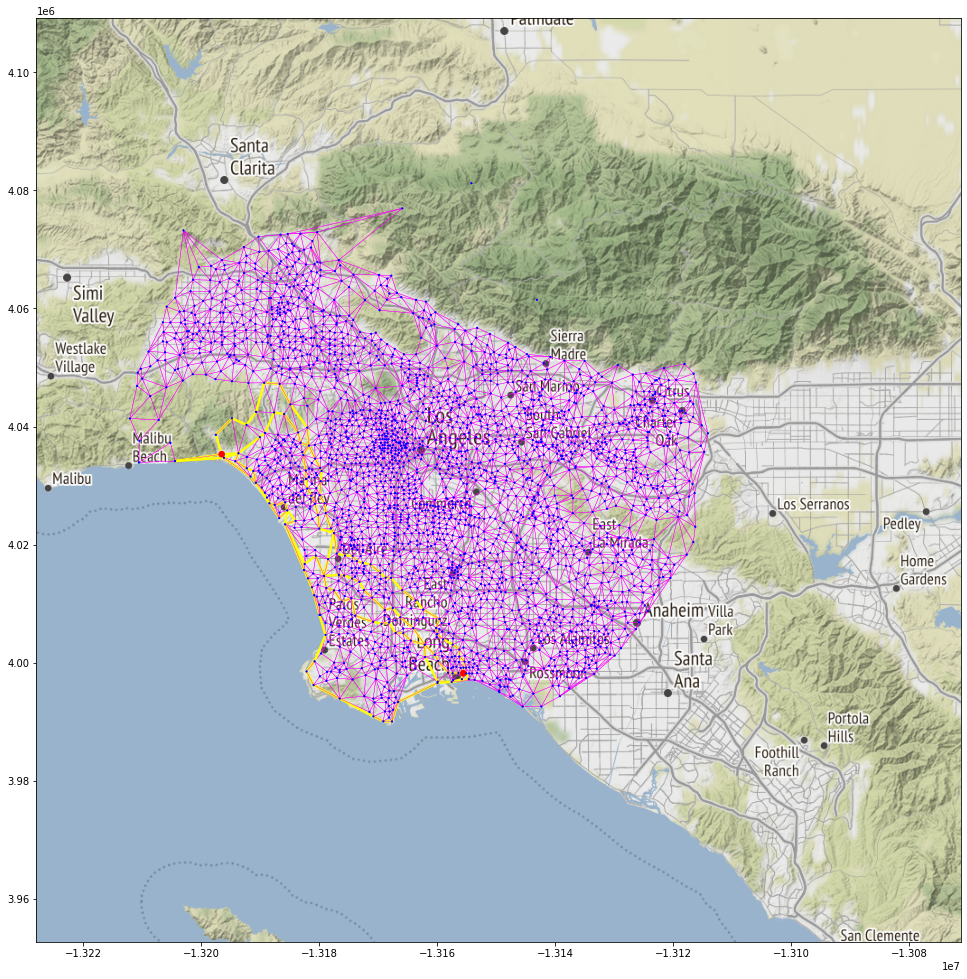

In [145]:
start = time.time()
plot_graph(uber_triangle_plotting_copy, "results/q15-edge-disjoint.png")
end = time.time()
print(end - start)